In [ ]:
# 컬럼 정보를 CSV 파일로 저장
def save_column_info_to_csv(df_column_info, output_file='column_info.csv'):
    """
    컬럼 정보를 CSV 파일로 저장
    
    Args:
        df_column_info (pd.DataFrame): 컬럼 정보가 정리된 DataFrame
        output_file (str): 저장할 CSV 파일명
    """
    try:
        # CSV 파일로 저장 (UTF-8 인코딩)
        df_column_info.to_csv(output_file, index=False, encoding='utf-8')
        
        print(f"✅ 컬럼 정보가 '{output_file}' 파일로 저장되었습니다.")
        print(f"📊 저장된 정보:")
        print(f"  - 총 컬럼 수: {len(df_column_info)}개")
        print(f"  - 총 파일 수: {df_column_info['파일명'].nunique()}개")
        
        # 파일별 요약 정보
        print(f"  - 파일별 상세:")
        file_summary = df_column_info.groupby('파일명').agg({
            '컬럼번호': 'count',
            '결측값개수': 'sum',
            '총행수': 'first'
        }).rename(columns={'컬럼번호': '컬럼수'})
        
        for file_name, row in file_summary.iterrows():
            missing_ratio = round((row['결측값개수'] / (row['컬럼수'] * row['총행수'])) * 100, 2)
            print(f"    · {file_name}: {row['컬럼수']}개 컬럼, {row['총행수']:,}행, 전체 결측률 {missing_ratio}%")
        
        # 결측값이 많은 컬럼 TOP 10
        print(f"\n⚠️  결측값이 많은 컬럼 TOP 10:")
        top_missing = df_column_info.nlargest(10, '결측값비율(%)')
        for _, row in top_missing.iterrows():
            print(f"    · {row['파일명']} - {row['컬럼명']}: {row['결측값비율(%)']}%")
            
    except Exception as e:
        print(f"❌ CSV 저장 중 오류 발생: {str(e)}")

# 컬럼 정보 CSV 저장 실행
save_column_info_to_csv(df_column_info, 'column_info.csv')

print(f"\n🎉 컬럼 정보 저장 완료!")

In [ ]:
# 모든 데이터셋의 컬럼 정보 수집
def create_column_info_dataframe(datasets):
    """
    여러 데이터셋의 컬럼 정보를 수집하여 DataFrame으로 반환
    
    Args:
        datasets (dict): {파일명: DataFrame} 형태의 딕셔너리
    
    Returns:
        pd.DataFrame: 컬럼 정보가 정리된 DataFrame
    """
    column_info_list = []
    
    for file_name, df in datasets.items():
        for i, column in enumerate(df.columns, 1):
            # 각 컬럼의 정보 수집
            missing_count = df[column].isnull().sum()
            missing_ratio = round((missing_count / len(df)) * 100, 2)
            data_type = str(df[column].dtype)
            excel_col_id = number_to_excel_column(i)
            
            column_info = {
                '파일명': file_name,
                '컬럼번호': i,
                '엑셀컬럼ID': excel_col_id,
                '컬럼명': column,
                '데이터타입': data_type,
                '결측값개수': missing_count,
                '결측값비율(%)': missing_ratio,
                '총행수': len(df),
                '유효값개수': len(df) - missing_count
            }
            column_info_list.append(column_info)
    
    return pd.DataFrame(column_info_list)

# 데이터셋 딕셔너리 준비
datasets_info = {
    'ENTR_BY_INS.csv': df_m2,      # M-2 가입자 정보
    'ENTR_INT_INS.csv': df_m1,     # M-1 신규 가입자 정보  
    'MVNO_PRD_PLC.csv': df_plan    # 요금제 정보
}

# 컬럼 정보 DataFrame 생성
df_column_info = create_column_info_dataframe(datasets_info)

print("📋 컬럼 정보 수집 완료!")
print(f"총 컬럼 수: {len(df_column_info)}개")
print(f"파일별 컬럼 수:")
for file_name in df_column_info['파일명'].unique():
    count = len(df_column_info[df_column_info['파일명'] == file_name])
    print(f"  · {file_name}: {count}개")

# 컬럼 정보 미리보기
print(f"\n📄 컬럼 정보 미리보기 (상위 10개):")
display(df_column_info.head(10))

# CSV 데이터 분석 노트북

통신사 가입자 정보 및 요금제 데이터 분석을 위한 Jupyter Notebook입니다.

## 데이터 파일 정보
- **ENTR_BY_INS.csv**: M-2 가입자 정보 (요금제)
- **ENTR_INT_INS.csv**: M-1 신규 가입자 정보 (요금제)
- **MVNO_PRD_PLC.csv**: 요금제 정보 (정책 관련 지원금 등)

In [ ]:
# 필요한 라이브러리 import
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

# 엑셀 컬럼 ID 생성 함수
def number_to_excel_column(n):
    """
    숫자를 엑셀 컬럼 ID로 변환 (1=A, 2=B, ..., 26=Z, 27=AA, ...)
    
    Args:
        n (int): 컬럼 번호 (1부터 시작)
    
    Returns:
        str: 엑셀 컬럼 ID
    """
    result = ""
    while n > 0:
        n -= 1  # 0-based로 변환
        result = chr(65 + n % 26) + result
        n //= 26
    return result

# 한글 폰트 설정 (matplotlib)
plt.rcParams['font.family'] = 'AppleGothic'  # macOS
plt.rcParams['axes.unicode_minus'] = False

# 출력 설정
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
pd.set_option('display.width', None)

print("📚 라이브러리 로드 완료!")

## 1. 데이터 로드

In [2]:
# CSV 파일들 로드
def load_csv_with_encoding(file_path, encodings=['utf-8', 'cp949', 'euc-kr']):
    """다양한 인코딩으로 CSV 파일 로드 시도"""
    for encoding in encodings:
        try:
            df = pd.read_csv(file_path, encoding=encoding)
            print(f"✅ {file_path} 로드 성공 (인코딩: {encoding})")
            return df, encoding
        except UnicodeDecodeError:
            continue
    raise ValueError(f"❌ {file_path} 로드 실패 - 지원되는 인코딩이 없습니다.")

# 데이터 로드
try:
    # M-2 가입자 정보
    df_m2, encoding_m2 = load_csv_with_encoding('csv/ENTR_BY_INS.csv', ['cp949', 'utf-8', 'euc-kr'])
    
    # M-1 신규 가입자 정보  
    df_m1, encoding_m1 = load_csv_with_encoding('csv/ENTR_INT_INS.csv', ['utf-8', 'cp949', 'euc-kr'])
    
    # 요금제 정보
    df_plan, encoding_plan = load_csv_with_encoding('csv/MVNO_PRD_PLC.csv', ['utf-8', 'cp949', 'euc-kr'])
    
    print("\n🎉 모든 데이터 로드 완료!")
    
except Exception as e:
    print(f"❌ 데이터 로드 중 오류: {e}")

✅ csv/ENTR_BY_INS.csv 로드 성공 (인코딩: cp949)
✅ csv/ENTR_INT_INS.csv 로드 성공 (인코딩: utf-8)
✅ csv/MVNO_PRD_PLC.csv 로드 성공 (인코딩: utf-8)

🎉 모든 데이터 로드 완료!


## 2. 데이터 기본 정보 확인

In [3]:
# 데이터 기본 정보
datasets = {
    'M-2 가입자 정보 (ENTR_BY_INS)': df_m2,
    'M-1 신규 가입자 정보 (ENTR_INT_INS)': df_m1,
    '요금제 정보 (MVNO_PRD_PLC)': df_plan
}

for name, df in datasets.items():
    print(f"\n{'='*60}")
    print(f"📊 {name}")
    print(f"{'='*60}")
    print(f"📏 데이터 크기: {df.shape[0]:,}행 × {df.shape[1]}열")
    print(f"💾 메모리 사용량: {df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")
    print(f"📋 컬럼 수: {len(df.columns)}개")
    
    # 결측값 정보
    missing_count = df.isnull().sum().sum()
    if missing_count > 0:
        print(f"⚠️  총 결측값: {missing_count:,}개")
    else:
        print(f"✅ 결측값 없음")


📊 M-2 가입자 정보 (ENTR_BY_INS)
📏 데이터 크기: 270,192행 × 111열
💾 메모리 사용량: 462.30 MB
📋 컬럼 수: 111개
⚠️  총 결측값: 540,527개

📊 M-1 신규 가입자 정보 (ENTR_INT_INS)
📏 데이터 크기: 38,161행 × 106열
💾 메모리 사용량: 129.72 MB
📋 컬럼 수: 106개
⚠️  총 결측값: 2,067,282개

📊 요금제 정보 (MVNO_PRD_PLC)
📏 데이터 크기: 138행 × 9열
💾 메모리 사용량: 0.04 MB
📋 컬럼 수: 9개
✅ 결측값 없음


## 3. M-2 가입자 정보 분석

In [4]:
# M-2 가입자 정보 컬럼 확인
print("📋 M-2 가입자 정보 컬럼 목록:")
for i, col in enumerate(df_m2.columns, 1):
    print(f"{i:2d}. {col}")

📋 M-2 가입자 정보 컬럼 목록:
 1. 정산년월
 2. 가입번호
 3. 고객명
 4. MVNO상품코드
 5. MVNO상품명
 6. 마켓코드
 7. 마켓명
 8. 파트너ID
 9. 유효시작일자
10. 유효종료일자
11. 가입대리점코드
12. 가입대리점명
13. 실판매점코드
14. 실판매점명
15. LTE여부
16. 선후불구분
17. 정산상품코드
18. 정산상품명
19. 수납금액
20. 도매대가합계(1~24+82)
21. 1.가입자당단가_도매대가(38*35*R)+(36*R)
22. 2.음성초과종량_도매대가(42*R)
23. 3.영상초과종량_도매대가(47*R)
24. 4.SMS초과종량_도매대가(52*R)+(57*R)+(62*R)+(67*R)
25. 5.데이터초과종량_도매대가(75*R)
26. 6.음성총량_도매대가(39*R)
27. 7.영상총량_도매대가(44*R)
28. 8.SMS총량_도매대가(49*R)+(54*R)+(59*R)+(64*R)
29. 9.데이터총량_도매대가(69*R)or(73*R)
30. 10.미니멈_도매대가(35*R)
31. 11.선불충전_도매대가(77*R)
32. 12.위약금_도매대가(위약금액*R)
33. 13.부가서비스(RS)_도매대가(청구금액*R)
34. 14.선불부가서비스_인센티브(23*R)
35. 15.후불부가서비스_인센티브(후불부가서비스수납금액*R)
36. 16.과금대행_수수료(33*R)
37. 17.청구대행_수수료(33*R)
38. 18.영업전산_수수료(34*R)
39. 19.수납대행_수수료(33*R)
40. 21.선불국제통화_사용금액(사용금액전체)
41. 22.선불국제SMS_사용금액(사용금액전체)
42. 23.선불부가서비스_사용금액(사용금액전체)
43. 24.선불정보_이용금액(사용금액전체)
44. 25.착신_수수료(39*R)
45. 26.번호이동_포트아웃_수수료(78*R)
46. 27.번호이동_선불포트인_수수료(79*R)
47. 28.번호이동_후불포트인_수수료(80*R)
48. 29.번호이동_후불포트인_주말수수료(81*R)
49. 3

In [5]:
# M-2 가입자 정보 샘플 데이터
print("📄 M-2 가입자 정보 샘플 (상위 5개):")
display(df_m2.head())

📄 M-2 가입자 정보 샘플 (상위 5개):


,정산년월,가입번호,고객명,MVNO상품코드,MVNO상품명,마켓코드,마켓명,파트너ID,유효시작일자,유효종료일자,가입대리점코드,가입대리점명,실판매점코드,실판매점명,LTE여부,선후불구분,정산상품코드,정산상품명,수납금액,도매대가합계(1~24+82),1.가입자당단가_도매대가(38*35*R)+(36*R),2.음성초과종량_도매대가(42*R),3.영상초과종량_도매대가(47*R),4.SMS초과종량_도매대가(52*R)+(57*R)+(62*R)+(67*R),5.데이터초과종량_도매대가(75*R),6.음성총량_도매대가(39*R),7.영상총량_도매대가(44*R),8.SMS총량_도매대가(49*R)+(54*R)+(59*R)+(64*R),9.데이터총량_도매대가(69*R)or(73*R),10.미니멈_도매대가(35*R),11.선불충전_도매대가(77*R),12.위약금_도매대가(위약금액*R),13.부가서비스(RS)_도매대가(청구금액*R),14.선불부가서비스_인센티브(23*R),15.후불부가서비스_인센티브(후불부가서비스수납금액*R),16.과금대행_수수료(33*R),17.청구대행_수수료(33*R),18.영업전산_수수료(34*R),19.수납대행_수수료(33*R),21.선불국제통화_사용금액(사용금액전체),22.선불국제SMS_사용금액(사용금액전체),23.선불부가서비스_사용금액(사용금액전체),24.선불정보_이용금액(사용금액전체),25.착신_수수료(39*R),26.번호이동_포트아웃_수수료(78*R),27.번호이동_선불포트인_수수료(79*R),28.번호이동_후불포트인_수수료(80*R),29.번호이동_후불포트인_주말수수료(81*R),30.MNP채권_포트아웃_수수료(채권금액*R),31.MNP채권_포트인_수수료(채권금액*R),32.타사_MNP채권_수수료(채권금액*R),33.총가입자수,34.월말가입자수,35.사용월수,36.일시정지월수,37.월중해지자수,38.기본료,39.음성통화_총사용초,40.음성통화_초과사용초,41.음성통화_총사용금액,42.음성통화_초과사용금액,43.음성통화_공제금액,44.영상통화_총사용초,45.영상통화_초과사용초,46.영상통화_총사용금액,47.영상통화_초과사용금액,48.영상통화_공제금액,49.SMS_총사용건,50.SMS_초과사용건,51.SMS_총사용금액,52.SMS_초과사용금액,53.SMS_공제금액,54.MMS텍스트_총사용건,55.MMS텍스트_초과사용건,56.MMS텍스트_총사용금액,57.MMS텍스트_초과사용금액,58.MMS텍스트_공제금액,59.MMS사진_총사용건,60.MMS사진_초과사용건,61.MMS사진_총사용금액,62.MMS사진_초과사용금액,63.MMS사진_공제금액,64.MMS영상_총사용건,65.MMS영상_초과사용건,66.MMS영상_총사용금액,67.MMS영상_초과사용금액,68.MMS영상_공제금액,69.데이타_총사용바이트,70.데이타_초과사용바이트,71.데이타_공제바이트,72.데이타_무료바이트,72-1.데이타_비정산_무료바이트,73.데이타_QOS적용바이트,71-1.데이타_기본공제바이트,71-2.데이타_QOS공제바이트,69-1.데이타_실사용바이트(통계용),74.데이타_총사용금액,75.데이터_초과사용금액,76.데이터_공제금액,77.선불충전금액,78.번호이동_포트아웃_건수,79.번호이동_선불포트인_건수,80.번호이동_후불포트인_건수,81.번호이동_후불포트인_주말_건수,82.PM1,83.데이터선구매상품명,84.선구매할인율(%),85.선구매차감데이터량,86.데이터총량_도매대가(선구매적용전),87.테스트회선여부,88.음성통화_지정회선사용초
0,202506,500224238285,S*N*S,LPZ0002633,[INS]인스 선불정액 300MB,INS,인스코리아,2010963,20210324,99991231,316139,인스코리아직영,P360696,인스코리아(온라인),Y,선불,LPZ0000195-A02,LTE 선불정액（4종-정액-정산단가:16460),0.0,330.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,110.0,0.0,220.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.00000,0.0,0.0,16460.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,NaN,NaN,0.0,0.0,N,0.0
1,202506,500224410560,S*N*,LPZ0002633,[INS]인스 선불정액 300MB,INS,인스코리아,2010963,20210329,99991231,316139,인스코리아직영,P360696,인스코리아(온라인),Y,선불,LPZ0000195-A02,LTE 선불정액（4종-정액-정산단가:16460),0.0,19039.47298,18709.47298,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,110.0,0.0,220.0,0.0,0.0,0.0,0.0,0.0,-103.61585,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.03333,0.0,0.0,16460.0,41834.0,0.0,82831.32,0.0,82831.32,0.0,0.0,0.0,0.0,0.0,3.0,0.0,60.0,0.0,60.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,400.0,0.0,400.0,0.0,0.0,0.0,0.0,0.0,3.169130e+10,0.0,3.169125e+10,47197.0,0.0,0.0,314572800.0,3.137668e+10,3.169129e+10,7028.63,0.0,7028.63,0.0,0.0,0.0,0.0,0.0,0,NaN,NaN,0.0,0.0,N,0.0
2,202506,500224446685,H*E*G,LPZ0002633,[INS]인스 선불정액 300MB,INS,인스코리아,2010963,20210329,99991231,316139,인스코리아직영,P360696,인스코리아(온라인),Y,선불,LPZ0000195-A02,LTE 선불정액（4종-정액-정산단가:16460),0.0,19039.47298,18709.47298,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,110.0,0.0,220.0,0.0,0.0,0.0,0.0,0.0,-5.34005,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.03333,0.0,0.0,16460.0,2156.0,0.0,4268.88,0.0,4268.88,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.102017e+10,0.0,4.102017e+10,5193.0,0.0,0.0,314572800.0,4.070559e+10,4.102016e+10,6803.72,0.0,6803.72,0.0,0.0,0.0,0.0,0.0,0,NaN,NaN,0.0,0.0,N,0.0
3,202506,500224853447,장*덕,LPZ0002633,[INS]인스 선불정액 300MB,INS,인스코리아,2010963,20210405,99991231,316139,인스코리아직영,P360696,인스코리아(온라인),Y,선불,LPZ0000195-A02,LTE 선불정액（4종-정액-정산단가:16460),0.0,19039.47298,18709.47298,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,110.0,0.0,220.0,0.0,0.0,0.0,0.0,0.0,-27.79998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.03333,0.0,0.0,16460.0,11224.0,0.0,22223.52,0.0,22223.

💰 수납금액 통계:
count    270192.000000
mean       6599.708347
std       12807.968743
min           0.000000
25%           0.000000
50%           0.000000
75%        8690.000000
max      717280.000000
Name: 수납금액, dtype: float64


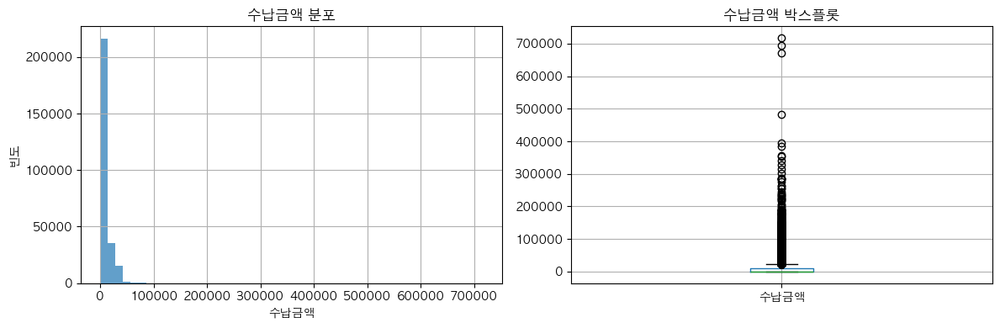

In [6]:
# M-2 가입자 정보 주요 통계
if '수납금액' in df_m2.columns:
    print("💰 수납금액 통계:")
    print(df_m2['수납금액'].describe())
    
    # 수납금액 분포 시각화
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    df_m2['수납금액'].hist(bins=50, alpha=0.7)
    plt.title('수납금액 분포')
    plt.xlabel('수납금액')
    plt.ylabel('빈도')
    
    plt.subplot(1, 2, 2)
    df_m2.boxplot(column='수납금액')
    plt.title('수납금액 박스플롯')
    
    plt.tight_layout()
    plt.show()

## 4. M-1 신규 가입자 정보 분석

In [7]:
# M-1 신규 가입자 정보 컬럼 확인
print("📋 M-1 신규 가입자 정보 컬럼 목록:")
for i, col in enumerate(df_m1.columns, 1):
    print(f"{i:2d}. {col}")

📋 M-1 신규 가입자 정보 컬럼 목록:
 1. 순번
 2. 처리일자
 3. 개통유형
 4. 영엄담당명
 5. 상위점명
 6. 유치대리점코드
 7. 유치대리점명
 8. 최종대리점코드
 9. 최종대리점명
10. 실판매POS코드
11. 실판매POS명
12. 실판매POS유형코드
13. 실판매POS유형명
14. 판매사번
15. 판매사번명
16. 관리점코드
17. 관리점명
18. 관리영업팀명
19. 가입번호
20. 고객번호
21. 청구계정번호
22. 상품번호
23. 고객명
24. 고객유형명
25. 사업자등록번호
26. 현재상태명
27. 서비스코드
28. 서비스명
29. 개통요금제코드
30. 개통요금제명
31. 선후불
32. 현재요금제코드
33. 현재요금제명
34. 월말요금제코드
35. 월말요금제명
36. 단말기구분코드
37. 단말기구분명
38. 단말기이력여부명
39. 개통모델코드
40. 개통모델일련번호
41. 현재모델코드
42. 현재모델일련번호
43. 월말모델
44. 월말모델일련번호
45. 기변등급명
46. 기변전모델
47. 기변전일련번호
48. 정책기변코드
49. 중고폰보상금액
50. 약정시작일
51. 약정종료일
52. 분리형할인코드
53. 기변일자
54. 재가입일
55. 취소일자
56. 해지일자
57. 출고등록일
58. 개통시간
59. 약정구분
60. 상품개통일
61. 최초개통일자
62. 중고폰회수여부
63. 분리할인명
64. 식스플랜
65. LTE그대로약정여부
66. 의무약정여부
67. 의무약정개월수
68. 의무약정금액
69. 할부개월수
70. 할부상태코드
71. 할부상태명
72. 할부청약상태코드
73. 할부청약상태명
74. 가입비상태명
75. 수납방법명
76. 할부여부명
77. 납부방법명
78. 지원금약정지급금액
79. 추가지원금액
80. 전환지원금액
81. 추가전환지원금액
82. 보조금여부
83. 보조금금액
84. 보조금밴드금액
85. 기변수수료금액
86. 현금판매금액
87. 카드판매금액
88. 할부판매금액
89. 가입서식유형명
90. 스캐너종류
91. OCR

In [8]:
# M-1 신규 가입자 정보 샘플 데이터
print("📄 M-1 신규 가입자 정보 샘플 (상위 5개):")
display(df_m1.head())

📄 M-1 신규 가입자 정보 샘플 (상위 5개):


,순번,처리일자,개통유형,영엄담당명,상위점명,유치대리점코드,유치대리점명,최종대리점코드,최종대리점명,실판매POS코드,실판매POS명,실판매POS유형코드,실판매POS유형명,판매사번,판매사번명,관리점코드,관리점명,관리영업팀명,가입번호,고객번호,청구계정번호,상품번호,고객명,고객유형명,사업자등록번호,현재상태명,서비스코드,서비스명,개통요금제코드,개통요금제명,선후불,현재요금제코드,현재요금제명,월말요금제코드,월말요금제명,단말기구분코드,단말기구분명,단말기이력여부명,개통모델코드,개통모델일련번호,현재모델코드,현재모델일련번호,월말모델,월말모델일련번호,기변등급명,기변전모델,기변전일련번호,정책기변코드,중고폰보상금액,약정시작일,약정종료일,분리형할인코드,기변일자,재가입일,취소일자,해지일자,출고등록일,개통시간,약정구분,상품개통일,최초개통일자,중고폰회수여부,분리할인명,식스플랜,LTE그대로약정여부,의무약정여부,의무약정개월수,의무약정금액,할부개월수,할부상태코드,할부상태명,할부청약상태코드,할부청약상태명,가입비상태명,수납방법명,할부여부명,납부방법명,지원금약정지급금액,추가지원금액,전환지원금액,추가전환지원금액,보조금여부,보조금금액,보조금밴드금액,기변수수료금액,현금판매금액,카드판매금액,할부판매금액,가입서식유형명,스캐너종류,OCR수정여부,전환가입여부,이전사업자명,이후사업자명,TPS계약번호,M2M사업구분대분류,M2M사업구분중분류,M2M사업구분소분류,SALE_CODE,신용등급코드,ARPU Grade,핫타겟팅여부,TPS결합번호,TPS결합유무,비고2 (단말기쿠폰할인금액),비고1 (단말기임직원추천코드)
0,1,2025/06/01,010,인스코리아본부,인스코리아센터,316139,인스코리아직영,316139,인스코리아직영,P552292,인스코리아(오프라인),PD23,일반사무실,D0311977,이진주,NaN,NaN,NaN,514438614667,892223746898,610692668282,010-****-4285,제이브랜딩 주식회사,상장법인,7.608604e+09,개통,LZP0000001,이동통신,LPZ0002642,[INS]인스 LTE선불표준,선불,LPZ0002642,[INS]인스 LTE선불표준,LPZ0002642,[INS]인스 LTE선불표준,N,유통폰,신규,LGU-OMPHONE2,**7749,LGU-OMPHONE2,**7749,LGU-OMPHONE2,**7749,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10:49:13,NaN,2025/06/01,2025/06/01,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,면제,NaN,NaN,지로,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,신분증스캐너,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GG,NaN,N,NaN,N,NaN,NaN
1,2,2025/06/01,010,인스코리아본부,인스코리아센터,316139,인스코리아직영,316139,인스코리아직영,P552292,인스코리아(오프라인),PD23,일반사무실,D0311977,이진주,NaN,NaN,NaN,516962662784,892223746898,619357989975,010-****-4346,제이브랜딩 주식회사,상장법인,7.608604e+09,개통,LZP0000001,이동통신,LPZ0002642,[INS]인스 LTE선불표준,선불,LPZ0002642,[INS]인스 LTE선불표준,LPZ0002642,[INS]인스 LTE선불표준,N,유통폰,신규,LGU-OMPHONE2,**7769,LGU-OMPHONE2,**7769,LGU-OMPHONE2,**7769,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10:53:07,NaN,2025/06/01,2025/06/01,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,면제,NaN,NaN,지로,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,신분증스캐너,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GG,NaN,N,NaN,N,NaN,NaN
2,3,2025/06/01,010,인스코리아본부,인스코리아센터,316139,인스코리아직영,316139,인스코리아직영,P059973,조암 팩토리,PD23,일반사무실,D0311977,이진주,NaN,NaN,NaN,513292045339,894339407229,610270903885,010-****-2552,R*************Z,일반외국인,NaN,개통,LZP0000001,이동통신,LPZ0002633,[INS]인스 선불정액 300MB,선불,LPZ0002633,[INS]인스 선불정액 300MB,LPZ0002633,[INS]인스 선불정액 300MB,N,유통폰,신규,LGU-OMPHONE2,**7809,LGU-OMPHONE2,**7809,LGU-OMPHONE2,**7809,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11:02:18,NaN,2025/06/01,2025/06/01,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,면제,NaN,NaN,지로,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,신분증스캐너,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Y2,NaN,N,NaN,N,NaN,NaN
3,4,2025/06/01,010,인스코리아본부,인스코리아센터,316139,인스코리아직영,316139,인스코리아직영,P060411,알뜰폰성지,PD23,일반사무실,D0311977,이진주,NaN,NaN,NaN,517165546050,894803208151,612080720403,010-****-0518,안*아,개인,NaN,개통,LZP0000001,이동통신,LPZ0002639,[INS]인스 정액선불 11G+,선불,LPZ0002639,[INS]인스 정액선불 11G+,LPZ0002639,[INS]인스 정액선불 11G+,N,유통폰,신규,LGU-OMPHONE2,**7481,LGU-OMPHONE2,**7481,LGU-OMPHONE2,**7481,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10:35:42,NaN,2025/06/01,2025/06/01,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,면제,NaN,NaN,지로,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,전자서식(PAD개통),스캐너기타,Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,N,NaN,NaN
4,5,2025/06/01,010,인스코리아본부,인스코리아센터,316139,인스코리아직영,316139,인스코리아직영,P159296,(주)예스텔레콤,PD23,일반사무실,D0311977,이진주,NaN,NaN,NaN,515622799160,899402912778,616479088507,010-****-4758,Y********G,일반외국인,NaN,개통,LZP0000001,이동통신,LPZ0002644,[INS]인스 선불정액 300MB+1Mbps,선불,LPZ0002644,[INS]인스 선불정액 300MB+1Mbps,LPZ0002644,[INS]인스 선불정액 300MB+1Mbps,N,유통폰,신규,LGU-OMPHONE2,**7438,LGU-OMPHONE2,**7438,LGU-OMPHONE2,**7438,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10:28:07,NaN,2025/06/01,2025/06/01,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,면제,NaN,NaN,지로,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,신분증스캐너,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,N,NaN,NaN


📊 개통유형별 분포:
개통유형
010    35443
MNP     2718
Name: count, dtype: int64


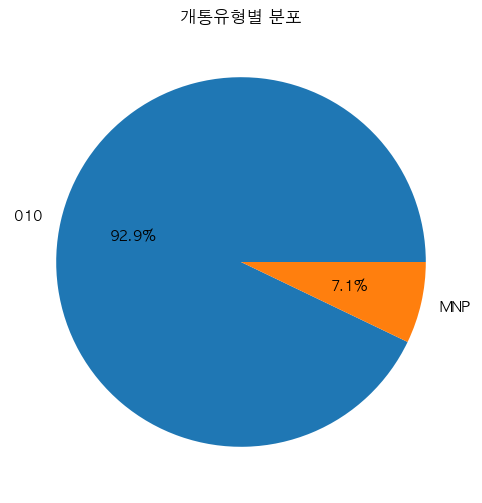

In [9]:
# 개통유형별 분석
if '개통유형' in df_m1.columns:
    print("📊 개통유형별 분포:")
    activation_counts = df_m1['개통유형'].value_counts()
    print(activation_counts)
    
    # 개통유형 파이차트
    plt.figure(figsize=(8, 6))
    plt.pie(activation_counts.values, labels=activation_counts.index, autopct='%1.1f%%')
    plt.title('개통유형별 분포')
    plt.show()

## 5. 요금제 정보 분석

In [10]:
# 요금제 정보 전체 보기
print("📋 요금제 정보:")
display(df_plan)

📋 요금제 정보:


,요금제코드,요금제명,기본료,평생할인,기간할인,이벤트가,정책금,정책반영시작일,정책반영종료일
0,LPZ0002633,[INS]인스 선불정액 300MB,0,0,0,0,0,1900-01-01,9999-12-31
1,LPZ0002635,[INS]인스 선불정액 300MB+(국제),0,0,0,0,0,1900-01-01,9999-12-31
2,LPZ0002637,[INS]인스 정액선불 10G,0,0,0,0,0,1900-01-01,9999-12-31
3,LPZ0002638,[INS]인스 정액선불 15GB+,0,0,0,0,0,1900-01-01,9999-12-31
4,LPZ0002639,[INS]인스 정액선불 11G+,0,0,0,0,0,1900-01-01,9999-12-31
...,...,...,...,...,...,...,...,...,...
133,PNP0000000000,GL수납 정산상품,0,0,0,0,0,1900-01-01,9999-12-31
134,PNP0000000003,부가서비스 인센티브 정산상품,0,0,0,0,0,1900-01-01,9999-12-31
135,PNP0000000004,번호이동 정산상품,0,0,0,0,0,1900-01-01,9999-12-31
136,PNP0000000005,MNP채권 정산상품,0,0,0,0,0,1900-01-01,9999-12-31


💰 요금제별 기본료:
                            요금제명  기본료
              [INS]인스 선불정액 300MB    0
         [INS]인스 선불정액 300MB+(국제)    0
                [INS]인스 정액선불 10G    0
              [INS]인스 정액선불 15GB+    0
               [INS]인스 정액선불 11G+    0
           [INS]인스 정액선불 11G+(국제)    0
             [INS]인스 데이터 프리미엄 선불    0
                 [INS]인스 LTE선불표준    0
        [INS]인스 선불정액 300MB+1Mbps    0
     선불정액363(10.3GB+3Mbps)_인스코리아    0
[INS]선불정액383(10.3GB+3Mbps)_인스코리아    0
      [INS][평생할인]인스 유심 스트롱 11GB+    0
       [INS][평생할인]인스 유심 올프리 7GB+    0
      [INS][평생할인]인스 유심 스트롱 15GB+    0
    [INS][평생할인]실속 150분+1GB(USIM)    0
    [INS][평생할인]인스 유심 음성 100분+1GB    0
       [INS][평생할인]인스 유심 올프리 6GB+    0
   [INS][평생할인]데이터 안심 10GB+(USIM)    0
    [INS][평생할인]데이터 안심 5GB+(USIM)    0
    [INS][평생할인]실속 200분+2GB(USIM)    0
   [INS][평생할인]인스 유심 음성 60분+500MB    0
    [INS][평생할인]실속 300분+3GB(USIM)    0
    [INS][평생할인]실속 300분+5GB(USIM)    0
  [INS][평생할인]인스 유심 음성 120분+1.5GB    0
        [INS]경희대 올프리 11GB+(USIM)    0


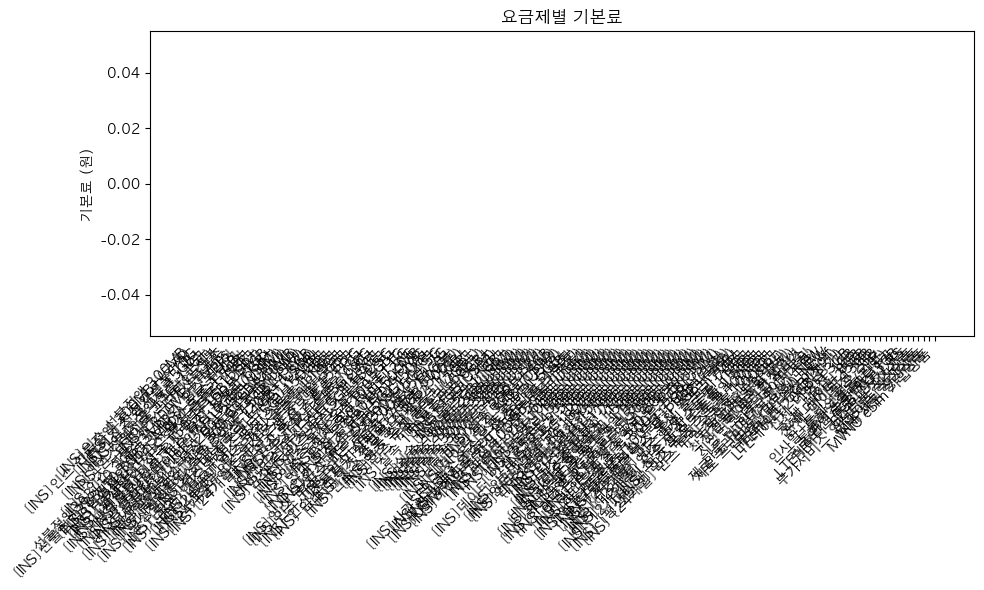

In [11]:
# 요금제별 기본료 분석
if '기본료' in df_plan.columns:
    print("💰 요금제별 기본료:")
    print(df_plan[['요금제명', '기본료']].to_string(index=False))
    
    # 기본료 시각화
    if len(df_plan) > 1:
        plt.figure(figsize=(10, 6))
        plt.bar(range(len(df_plan)), df_plan['기본료'])
        plt.xticks(range(len(df_plan)), df_plan['요금제명'], rotation=45, ha='right')
        plt.title('요금제별 기본료')
        plt.ylabel('기본료 (원)')
        plt.tight_layout()
        plt.show()

## 6. 데이터 간 관계 분석

📊 M-2 데이터 - 요금제별 가입자 수:
MVNO상품명
[INS]인스 LTE선불표준                  78510
번호이동 정산상품                        54967
[INS]인스 선불정액 300MB               15876
[INS][24개월] 인스 유심 스트롱 11GB+      14594
[INS][평생할인]데이터 안심 10GB+(USIM)    11539
                                 ...  
[INS]인스 유심 스트롱 6.6G                  1
LTE데이터 20GB(장기)                      1
[INS]USIM 올프리 11GB+(프리쿠폰)            1
지정번호 필터링 서비스                         1
[INS]하나은행 5G 올프리 150GB+(USIM)        1
Name: count, Length: 138, dtype: int64


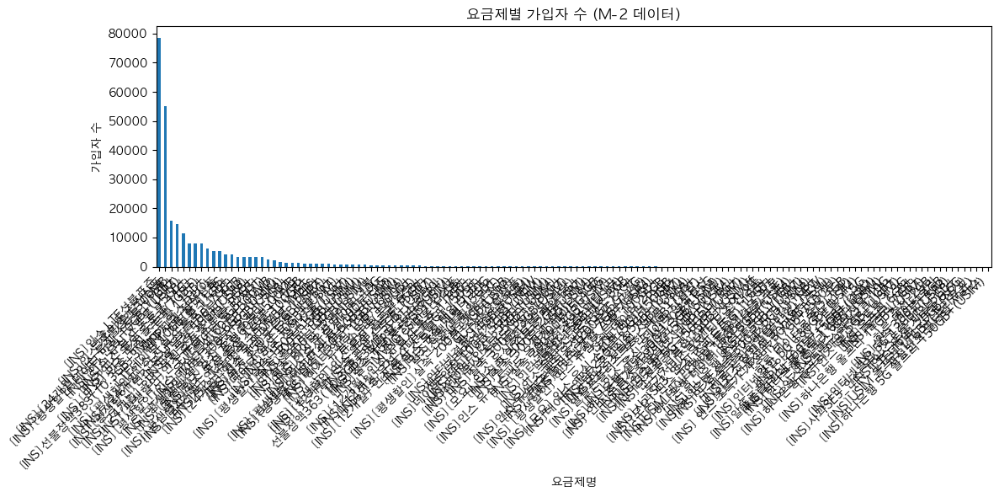

In [12]:
# M-2 데이터에서 요금제별 분석
if 'MVNO상품명' in df_m2.columns:
    print("📊 M-2 데이터 - 요금제별 가입자 수:")
    plan_counts = df_m2['MVNO상품명'].value_counts()
    print(plan_counts)
    
    # 요금제별 가입자 수 시각화
    plt.figure(figsize=(12, 6))
    plan_counts.plot(kind='bar')
    plt.title('요금제별 가입자 수 (M-2 데이터)')
    plt.xlabel('요금제명')
    plt.ylabel('가입자 수')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

📊 M-1 데이터 - 요금제별 신규 가입자 수:
현재요금제명
[INS]인스 LTE선불표준                     32827
[INS]인스 선불정액 300MB                   1484
[INS] 인스 유심 스트롱 15GB+                 803
[INS]인스 유심 스트롱 11G+                   760
[INS]선불정액383(10.3GB+3Mbps)_인스코리아      507
[INS]인스 유심 올프리(7GB+)                  343
[INS]올프리 5GB+(USIM)                   181
[INS] 인스 유심 스트롱 100GB+                107
[INS][평생할인]실속 300분+5GB(USIM)           91
[INS][24개월] 인스 유심 스트롱 11GB+            90
[INS] [24개월]인스 유심 11GB+(알뜰폰플러스)        84
[INS][평생할인]실속 150분+1GB(USIM)           73
[INS][평생할인]데이터 안심 10GB+(USIM)          67
[INS]인스 선불정액 300MB+1Mbps               59
[INS]인스 유심 스트롱 매일5G+                   58
[INS] [24개월]인스 유심 7GB+(알뜰폰플러스)         51
[INS][평생할인]인스 유심 음성 100분+1GB           42
[INS]인스 정액선불 11G+                      41
[INS] [24개월]인스 유심 100GB+(알뜰폰플러스)       40
[INS][평생할인]인스 유심 음성 60분+500MB          39
[INS] [24개월] 인스 유심 스트롱 100GB+          39
[INS]인스 데이터 프리미엄 선불                    37
[INS] [24개월]인스 유심 일5GB+(알뜰폰플러스)        28


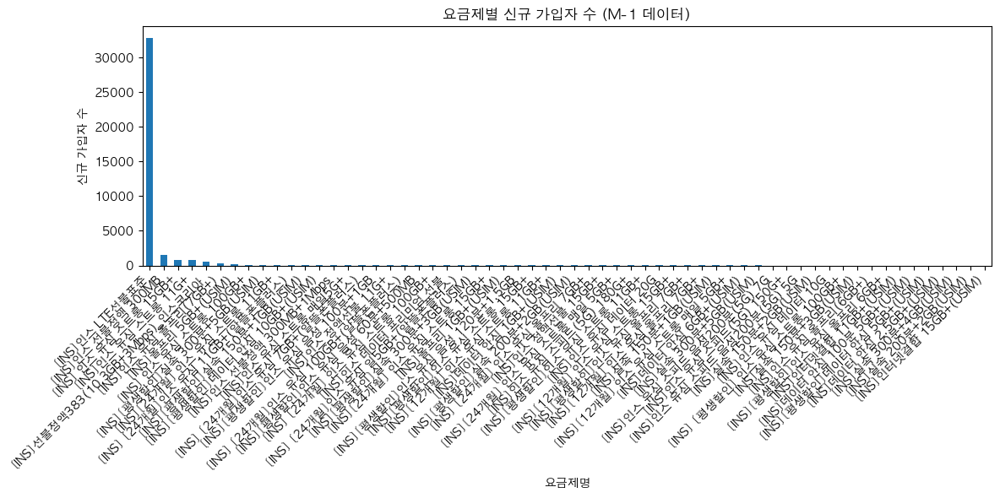

In [13]:
# M-1 데이터에서 요금제별 분석
if '현재요금제명' in df_m1.columns:
    print("📊 M-1 데이터 - 요금제별 신규 가입자 수:")
    new_plan_counts = df_m1['현재요금제명'].value_counts()
    print(new_plan_counts)
    
    # 요금제별 신규 가입자 수 시각화
    plt.figure(figsize=(12, 6))
    new_plan_counts.plot(kind='bar')
    plt.title('요금제별 신규 가입자 수 (M-1 데이터)')
    plt.xlabel('요금제명')
    plt.ylabel('신규 가입자 수')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

## 7. 인터랙티브 시각화 (Plotly)

In [14]:
# M-2 데이터 인터랙티브 시각화
if 'MVNO상품명' in df_m2.columns and '수납금액' in df_m2.columns:
    # 요금제별 수납금액 분포
    fig = px.box(df_m2, x='MVNO상품명', y='수납금액', 
                 title='요금제별 수납금액 분포',
                 labels={'MVNO상품명': '요금제명', '수납금액': '수납금액 (원)'})
    fig.update_xaxes(tickangle=45)
    fig.show()
    
    # 수납금액 히스토그램
    fig = px.histogram(df_m2, x='수납금액', nbins=50,
                       title='수납금액 분포 히스토그램',
                       labels={'수납금액': '수납금액 (원)', 'count': '빈도'})
    fig.show()

## 8. 데이터 요약 및 인사이트

In [15]:
# 전체 데이터 요약
print("📊 전체 데이터 요약")
print("=" * 50)

total_m2_users = len(df_m2)
total_m1_users = len(df_m1)
total_plans = len(df_plan)

print(f"📈 M-2 가입자 수: {total_m2_users:,}명")
print(f"📈 M-1 신규 가입자 수: {total_m1_users:,}명")
print(f"📋 총 요금제 수: {total_plans}개")

if '수납금액' in df_m2.columns:
    total_revenue = df_m2['수납금액'].sum()
    avg_revenue = df_m2['수납금액'].mean()
    print(f"💰 총 수납금액: {total_revenue:,.0f}원")
    print(f"💰 평균 수납금액: {avg_revenue:,.0f}원")

print("\n🎯 주요 인사이트:")
print("- 데이터 분석을 통해 요금제별 가입자 현황 파악 가능")
print("- 신규 가입자와 기존 가입자 패턴 비교 분석 가능")
print("- 수익성 분석 및 요금제 최적화 방향 도출 가능")

📊 전체 데이터 요약
📈 M-2 가입자 수: 270,192명
📈 M-1 신규 가입자 수: 38,161명
📋 총 요금제 수: 138개
💰 총 수납금액: 1,783,188,398원
💰 평균 수납금액: 6,600원

🎯 주요 인사이트:
- 데이터 분석을 통해 요금제별 가입자 현황 파악 가능
- 신규 가입자와 기존 가입자 패턴 비교 분석 가능
- 수익성 분석 및 요금제 최적화 방향 도출 가능


## 9. 컬럼 정보 CSV 저장

모든 데이터셋의 컬럼 정보를 체계적으로 정리하여 CSV 파일로 저장합니다.